In [654]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [724]:
#First let create out constants from the NASA Page 
gravity_constant = 6.67430e-11 
mass_venus = 4.867e24
time_in_seconds = 60 * 60 * 3
ASTO_U = 1.496e11 #This is a astronomical unit in meter
mass_sun = 1.989e30

In [726]:
ecc = 0.00677323 #"This is a measure of how far a planet's orbit about the Sun"
s_m_axis = 0.72333199 * ASTO_U
venus_perihelion = s_m_axis * (1 - ecc) # The closest and furthest points in a planet's orbit about the Sun

In [728]:
velocity_i = np.sqrt(gravity_constant * mass_sun * (2 / venus_perihelion - 1 / s_m_axis))
print("initial velocity = ",velocity_i, "m/s")

initial velocity =  35263.64832342882 m/s


In [730]:

pos = np.array([venus_perihelion, 0], dtype=float)  
v = np.array([0, velocity_i], dtype=float)  

x_pos = []
y_pos = []
area_s = []

In [748]:
def gravitational_force(pos):
    r = np.linalg.norm(pos) 
    F_magnitude = gravity_constant * mass_sun / r**2
    F_direction = -pos / r
    return F_magnitude * F_direction

In [750]:
def area_calculation(pos, prev_pos):
    r1 = np.linalg.norm(prev_pos)
    r2 = np.linalg.norm(pos)
    theta = np.arccos(np.dot(prev_pos, pos) / (r1 * r2))
    area = 0.5 * r1 * r2 * np.sin(theta)
    return area

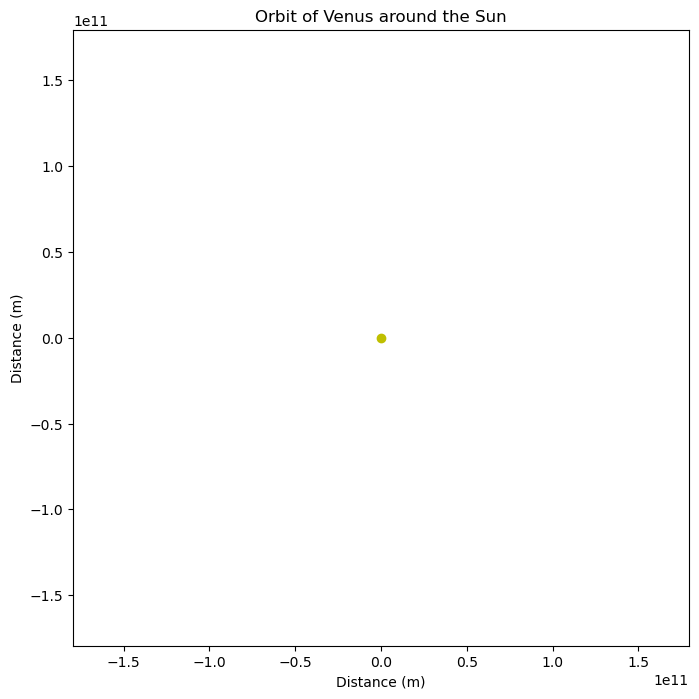

In [752]:
fig, ax = plt.subplots(figsize=(8, 8))  
ax.set_aspect('equal')
ax.set_xlim(-1.2 * ASTO_U, 1.2 * ASTO_U)  
ax.set_ylim(-1.2 * ASTO_U, 1.2 * ASTO_U)  
ax.plot(0, 0, 'yo', label="Sun") 
planet, = ax.plot([], [], 'bo', label="Venus")  

plt.title("Orbit of Venus around the Sun")
plt.xlabel("Distance (m)")
plt.ylabel("Distance (m)")
plt.show()

In [738]:
# Initialize the plot
def init():
    planet.set_data([], [])
    return planet,


In [740]:
def update(frame):
    global pos, v
    prev_pos = np.copy(pos)
    force = gravitational_force(pos)
    acceleration = force 

    
    v += acceleration * time_in_seconds
    pos += v * time_in_seconds

    area_swept = area_calculation(pos, prev_pos)
    area_s.append(area_swept)
    
    x_pos.append(pos[0])
    y_pos.append(pos[1])
    
    planet.set_data([pos[0]], [pos[1]])
    return planet,

In [742]:
ani = FuncAnimation(fig, update, frames=365, init_func=init, blit=True, interval=20)

HTML(ani.to_jshtml())


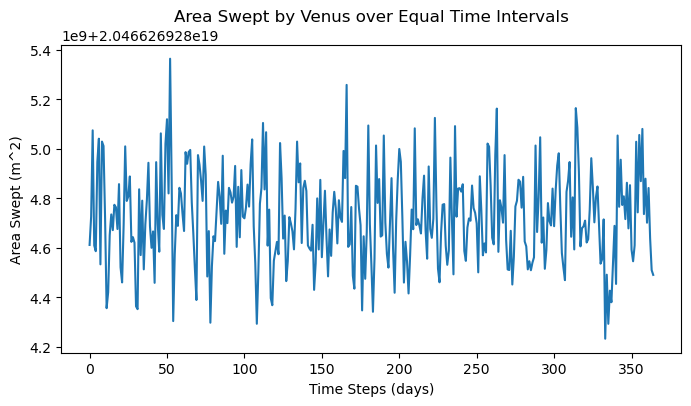

In [743]:
plt.figure(figsize=(8, 4))
plt.plot(area_s)
plt.title("Area Swept by Venus over Equal Time Intervals")
plt.xlabel("Time Steps (days)")
plt.ylabel("Area Swept (m^2)")
plt.show()